# Capstone Project: UN Sustainable Development Goals Text Classification

The Uniter Nations created 17 measurable indicators for development called the Sustainable Development Goals or SCG, they consists of: 

1. No Poverty
2. Zero Hunger
3. Good Health and Well Being
4. Quality Education
5. Gender Equality
6. Clean Water and Sanitation
7. Affordable and Clean Energy
8. Decent Work and Economic Growth
9. Industry, Innovation, and Infrastructure
10. Reduced Inequalities
11. Sustainable Cities and Communities
12. Responsible Consumption and Production
13. Climate Action
14. Life Below Water
15. Life on Land
16. Peace, Justice and String Institutions
17. Partnerships


Each SDG has several “targets”, or social outcomes that the UN hopes to achieve by 2030. Each of these targets is measured using a set of indicators. These indicators represent the quantitative measurements that will be used to judge whether each SDG target has been achieved or not by 2030.

I will be classifying text content by its relevance to the measurable indicators of the United Nations’ Sustainable Development Goal 3: Health and Well-Being or being refer as SDG 3. SDG 3 has 14 targets and 27 indicators.

##### The SDG 3 Indicators

Theere are 27 possible SDG 3 indicators, in the dataset each indicator will be refer using code, e.g. "3.1.1":

- 3.1.1 - Maternal mortality ratio
- 3.1.2 - Proportion of births attended by skilled health personnel
- 3.2.1 - Under-5 mortality rate
- 3.2.2 - Neonatal mortality rate
- 3.3.1 - Number of new HIV infections per 1 000 uninfected population, by sex, age and key populations
- 3.3.2 - Tuberculosis incidence per 100 000 population
- 3.3.3 - Malaria incidence per 1 000 population
- 3.3.4 - Hepatitis B incidence per 100 000 population
- 3.3.5 - Number of people requiring interventions against neglected tropical diseases
- 3.4.1 - Mortality rate attributed to cardiovascular disease, cancer, diabetes or chronic respiratory disease
- 3.4.2 - Suicide mortality rate
- 3.5.1 - Coverage of treatment interventions (pharmacological, psychosocial and rehabilitation and aftercare services) for substance use disorders
- 3.5.2 - Harmful use of alcohol, defined according to the national context as alcohol per capita consumption (aged 15 years and older) within a calendar year in litres of pure alcohol
- 3.6.1 - Death rate due to road traffic injuries
- 3.7.1 - Proportion of women of reproductive age (aged 15–49 years) who have their need for family planning satisfied with modern methods
- 3.7.2 - Adolescent birth rate (aged 10–14 years; aged 15–19 years) per 1 000 women in that age group
- 3.8.1 - Coverage of essential health services (defined as the average coverage of essential services based on tracer interventions that include reproductive, maternal, newborn and child health, infectious diseases, non-communicable diseases and service capacity and access, among the general and the most disadvantaged population)
- 3.8.2 - Proportion of population with large household expenditures on health as a share of total household expenditure or income
- 3.9.1 - Mortality rate attributed to household and ambient air pollution
- 3.9.2 - Mortality rate attributed to unsafe water, unsafe sanitation and lack of hygiene (exposure to unsafe Water, Sanitation and Hygiene for All (WASH) services)
- 3.9.3 - Mortality rate attributed to unintentional poisoning
- 3.a.1 - Age-standardized prevalence of current tobacco use among persons aged 15 years and older
- 3.b.1 - Proportion of the target population covered by all vaccines included in their national programme
- 3.b.2 - Total net official development assistance to medical research and basic health sector
- 3.b.3 - Proportion of health facilities that have a core set of relevant essential medicines available and affordable on a sustainable basis
- 3.c.1 - Health worker density and distribution
- 3.d.1 - International Health Regulations (IHR) capacity and health emergency preparedness

### The Problem

Many government bodies, donors and developers sttrugle to identify which tenders, programs or news articles are related to which of the 27 SDG 3 indicators and if they are worth investment or partnership. 

The aim for this project is to create a classifier that labels text content by the 27 SDG 3 indicators that are most “relevant.” 

The model that classifies text content by relevant SDG indicators would be used to help algorithmically identify development projects, organizations, and documents that relate to the same SDG targets and indicators.

This would be useful for governments, development donors, and development implementers seeking to align resources, find partners, or perform outcomes-focused research.

---
# The Train Data

The training data includes approximately 3,000 web-scraped text from tenders, programs, and documents, as well as news articles about international development and humanitarian aid, and finally text descriptions of organizations involved in those sectors.

This dataset includes the "outcome" which in this competition is the "label(s)," i.e. which of the 27 indicators are relevant to the given text. This dataset includes the columns: 
- ID: Unique ID of text to be classified
- Type: The type or source of the text.
- Text
- Label_1 through Label_12

Label_1 through Label_12: These columns are populated starting at Label_1 increasing incrementally until all relevent classifications are populated, to a maximum of 12 Labels. The remaining Labels are left blank.

Source: https://zindi.africa/competitions/sustainable-development-goals-sdgs-text-classification-challenge

In [1]:
import nltk

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords

import regex as re

In [2]:
train = pd.read_csv('data/Devex_train.csv')

In [3]:
train

,Unique ID,Type,Text,Label 1,Label 2,Label 3,Label 4,Label 5,Label 6,Label 7,Label 8,Label 9,Label 10,Label 11,Label 12
0,12555,Grant,Centers of Biomedical Research Excellence (COB...,3.b.2 - Total net official development assista...,3.c.1 - Health worker density and distribution,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,14108,Grant,Research on Regenerative Medicine <h2><strong>...,3.b.2 - Total net official development assista...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,23168,Organization,Catholic Health Association of India (CHAI): <...,3.d.1 - International Health Regulations (IHR)...,3.8.1 - Coverage of essential health services ...,3.8.2 - Proportion of population with large ho...,3.b.3 - Proportion of health facilities that h...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,219512,Contract,Quality Improvement Initiatives for Diabetes,3.4.1 - Mortality rate attributed to cardiovas...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,274093,Tender,Provision of Thalassemia Drugs and Disposables...,3.3.5 - Number of people requiring interventio...,3.4.1 - Mortality rate attributed to cardiovas...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,How rats could help reduce the global TB burden:,"3.3.2 - Tuberculosis incidence per 100,000 pop...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2991,1209,Open Opp,Exploratory Analyses of Adherence Strategies a...,3.b.2 - Total net official development assista...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2992,14342,Grant,Study on Vaccines for Diarrhoeal Diseases or L...,3.b.1 - Proportion of the target population co...,3.b.2 - Total net official development assista...,3.3.5 - Number of people requiring interventio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2993,12353,Grant,Regional Engagement Stimulation Fund on Human ...,"3.3.1 - Number of new HIV infections per 1,000...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2995 entries, 0 to 2994
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Unique ID  2995 non-null   int64  
 1   Type       2995 non-null   object 
 2   Text       2995 non-null   object 
 3   Label 1    2995 non-null   object 
 4   Label 2    1635 non-null   object 
 5   Label 3    738 non-null    object 
 6   Label 4    312 non-null    object 
 7   Label 5    142 non-null    object 
 8   Label 6    59 non-null     object 
 9   Label 7    21 non-null     object 
 10  Label 8    10 non-null     object 
 11  Label 9    4 non-null      object 
 12  Label 10   2 non-null      object 
 13  Label 11   0 non-null      float64
 14  Label 12   0 non-null      float64
dtypes: float64(2), int64(1), object(12)
memory usage: 351.1+ KB


In [5]:
train.fillna(0.0,inplace=True)

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2995 entries, 0 to 2994
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Unique ID  2995 non-null   int64  
 1   Type       2995 non-null   object 
 2   Text       2995 non-null   object 
 3   Label 1    2995 non-null   object 
 4   Label 2    2995 non-null   object 
 5   Label 3    2995 non-null   object 
 6   Label 4    2995 non-null   object 
 7   Label 5    2995 non-null   object 
 8   Label 6    2995 non-null   object 
 9   Label 7    2995 non-null   object 
 10  Label 8    2995 non-null   object 
 11  Label 9    2995 non-null   object 
 12  Label 10   2995 non-null   object 
 13  Label 11   2995 non-null   float64
 14  Label 12   2995 non-null   float64
dtypes: float64(2), int64(1), object(12)
memory usage: 351.1+ KB


In [7]:
sample = pd.read_csv('data/Devex_submission_format.csv')

In [8]:
sample

,ID,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,3.3.4,3.3.5,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,11437,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
1,11474,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0
2,11475,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
3,11476,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,...,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
4,11486,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
993,11375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
994,11390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
995,11406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
996,11428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


---
# Text Prepossessing and Feature Engineering

There are 2995 text to work with. I will be exploring what each text looks like and create a cleaning function to get rid of irrelevent text in the explored text block.

Here are some sample text:

In [9]:
train['Text']

0       Centers of Biomedical Research Excellence (COB...
1       Research on Regenerative Medicine <h2><strong>...
2       Catholic Health Association of India (CHAI): <...
3            Quality Improvement Initiatives for Diabetes
4       Provision of Thalassemia Drugs and Disposables...
                              ...                        
2990     How rats could help reduce the global TB burden:
2991    Exploratory Analyses of Adherence Strategies a...
2992    Study on Vaccines for Diarrhoeal Diseases or L...
2993    Regional Engagement Stimulation Fund on Human ...
2994    Graphic Design Services Consultancy ; ; <p><st...
Name: Text, Length: 2995, dtype: object

In [10]:
#example of one of the test
train.Text[2]

'Catholic Health Association of India (CHAI): <p>The Catholic Health Association of India celebrates it 73 years of service. The organization has grown in terms of its membership, services and expanded the scope for encompassing and achieving the mission for which it was established in 1943. The organization has been shaped and nurtured by the visionaries who directed it and by the impact of national and international happenings. There have been paradigm shifts to meet the needs and to fulfill the vision and mission of reaching the poor and marginalized.</p>    <p>VISION&nbsp;</p>    <p>The Catholic Health Association of India upholds its commitment to bring &lsquo;health for all&rsquo;.</p>    <p>It views health as a state of complete physical, mental, social and spiritual well-being, and not merely the absence of sickness. Accordingly, CHAI envisions an INDIA wherein people,</p>    <p>are assured of clean air, water and environment;<br />do not suffer from any preventable disease;<br

### Normalization

From the example the text have a lot of html markings, &nbsp and non letter. To make sure the text are the same I will normalized them.

This will be done by:
- Removing html marking
- Removing &nbsp
- Removing non letters, symbols and numbers
- Lowercasing everything

In [11]:
test = train.Text[0]
test

'Centers of Biomedical Research Excellence (COBRE) Phase III - Transitional Centers     <p><strong>Funding Opportunity Description</strong></p>    <p><a name="_Toc258873267"></a>The Institutional Development Award (IDeA) Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH. Created through congressional mandate, the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states. The IDeA Program aims to achieve this goal through two major initiatives: (1) the IDeA Networks of Biomedical Research Excellence (INBRE), and (2) the Centers of Biomedical Research Excellence (COBRE).</p>    <p>The COBRE initiative seeks to develop unique, innovative, multidisciplinary, and collaborative state-of-the-art biomedical and behavioral research centers focused on a scientifi

In [12]:
#deleting the html marking
html = re.sub(r"<.*?>","",test)
html

'Centers of Biomedical Research Excellence (COBRE) Phase III - Transitional Centers     Funding Opportunity Description    The Institutional Development Award (IDeA) Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH. Created through congressional mandate, the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states. The IDeA Program aims to achieve this goal through two major initiatives: (1) the IDeA Networks of Biomedical Research Excellence (INBRE), and (2) the Centers of Biomedical Research Excellence (COBRE).    The COBRE initiative seeks to develop unique, innovative, multidisciplinary, and collaborative state-of-the-art biomedical and behavioral research centers focused on a scientific theme that is nascent or only minimally developed at applica

In [13]:
#removing &nbsp
nbsp = re.sub(r"&nbsp","",html)
nbsp

'Centers of Biomedical Research Excellence (COBRE) Phase III - Transitional Centers     Funding Opportunity Description    The Institutional Development Award (IDeA) Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH. Created through congressional mandate, the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states. The IDeA Program aims to achieve this goal through two major initiatives: (1) the IDeA Networks of Biomedical Research Excellence (INBRE), and (2) the Centers of Biomedical Research Excellence (COBRE).    The COBRE initiative seeks to develop unique, innovative, multidisciplinary, and collaborative state-of-the-art biomedical and behavioral research centers focused on a scientific theme that is nascent or only minimally developed at applica

In [14]:
#removing all numbers, symbols and non letters
letters_only = re.sub("[^a-zA-Z]", " ", nbsp)
letters_only

'Centers of Biomedical Research Excellence  COBRE  Phase III   Transitional Centers     Funding Opportunity Description    The Institutional Development Award  IDeA  Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH  Created through congressional mandate  the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states  The IDeA Program aims to achieve this goal through two major initiatives      the IDeA Networks of Biomedical Research Excellence  INBRE   and     the Centers of Biomedical Research Excellence  COBRE      The COBRE initiative seeks to develop unique  innovative  multidisciplinary  and collaborative state of the art biomedical and behavioral research centers focused on a scientific theme that is nascent or only minimally developed at applica

In [15]:
#making everything lowercase
lowercase = letters_only.lower().split()
lowercase

['centers',
 'of',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'phase',
 'iii',
 'transitional',
 'centers',
 'funding',
 'opportunity',
 'description',
 'the',
 'institutional',
 'development',
 'award',
 'idea',
 'program',
 'endeavors',
 'to',
 'stimulate',
 'research',
 'at',
 'institutions',
 'in',
 'states',
 'that',
 'have',
 'not',
 'traditionally',
 'received',
 'significant',
 'levels',
 'of',
 'research',
 'funding',
 'from',
 'the',
 'nih',
 'created',
 'through',
 'congressional',
 'mandate',
 'the',
 'idea',
 'program',
 'broadens',
 'the',
 'geographic',
 'distribution',
 'of',
 'nih',
 'funding',
 'for',
 'competitive',
 'biomedical',
 'and',
 'behavioral',
 'research',
 'by',
 'enhancing',
 'the',
 'research',
 'capabilities',
 'of',
 'institutions',
 'in',
 'eligible',
 'states',
 'the',
 'idea',
 'program',
 'aims',
 'to',
 'achieve',
 'this',
 'goal',
 'through',
 'two',
 'major',
 'initiatives',
 'the',
 'idea',
 'networks',
 'of',
 'biomedical',
 'resear

### Stop Words

Some words in the English language, while necessary, don't contribute much to the meaning of a phrase. These words, such as "when", "had", "those" or "before", are called stop words and should be filtered out. 

In [16]:
stop_words = nltk.corpus.stopwords.words('english')

In [17]:
#removing stop words
words = [w for w in lowercase if not w in stop_words]
words

['centers',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'phase',
 'iii',
 'transitional',
 'centers',
 'funding',
 'opportunity',
 'description',
 'institutional',
 'development',
 'award',
 'idea',
 'program',
 'endeavors',
 'stimulate',
 'research',
 'institutions',
 'states',
 'traditionally',
 'received',
 'significant',
 'levels',
 'research',
 'funding',
 'nih',
 'created',
 'congressional',
 'mandate',
 'idea',
 'program',
 'broadens',
 'geographic',
 'distribution',
 'nih',
 'funding',
 'competitive',
 'biomedical',
 'behavioral',
 'research',
 'enhancing',
 'research',
 'capabilities',
 'institutions',
 'eligible',
 'states',
 'idea',
 'program',
 'aims',
 'achieve',
 'goal',
 'two',
 'major',
 'initiatives',
 'idea',
 'networks',
 'biomedical',
 'research',
 'excellence',
 'inbre',
 'centers',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'cobre',
 'initiative',
 'seeks',
 'develop',
 'unique',
 'innovative',
 'multidisciplinary',
 'collaborative',
 'state',

### Stemming, Tolkenizing and Lemmatizing

The three method allow me to clean and separate wods to their stem, root and individual words. I will be exploring what each process do to the sample text.

In [18]:
porter = PorterStemmer()
ps = [porter.stem(i) for i in words]
ps

['center',
 'biomed',
 'research',
 'excel',
 'cobr',
 'phase',
 'iii',
 'transit',
 'center',
 'fund',
 'opportun',
 'descript',
 'institut',
 'develop',
 'award',
 'idea',
 'program',
 'endeavor',
 'stimul',
 'research',
 'institut',
 'state',
 'tradit',
 'receiv',
 'signific',
 'level',
 'research',
 'fund',
 'nih',
 'creat',
 'congression',
 'mandat',
 'idea',
 'program',
 'broaden',
 'geograph',
 'distribut',
 'nih',
 'fund',
 'competit',
 'biomed',
 'behavior',
 'research',
 'enhanc',
 'research',
 'capabl',
 'institut',
 'elig',
 'state',
 'idea',
 'program',
 'aim',
 'achiev',
 'goal',
 'two',
 'major',
 'initi',
 'idea',
 'network',
 'biomed',
 'research',
 'excel',
 'inbr',
 'center',
 'biomed',
 'research',
 'excel',
 'cobr',
 'cobr',
 'initi',
 'seek',
 'develop',
 'uniqu',
 'innov',
 'multidisciplinari',
 'collabor',
 'state',
 'art',
 'biomed',
 'behavior',
 'research',
 'center',
 'focus',
 'scientif',
 'theme',
 'nascent',
 'minim',
 'develop',
 'applic',
 'institut',
 

In [19]:
tokenizer = RegexpTokenizer(r'\w+')
tokens = tokenizer.tokenize(test)
tokens

['Centers',
 'of',
 'Biomedical',
 'Research',
 'Excellence',
 'COBRE',
 'Phase',
 'III',
 'Transitional',
 'Centers',
 'p',
 'strong',
 'Funding',
 'Opportunity',
 'Description',
 'strong',
 'p',
 'p',
 'a',
 'name',
 '_Toc258873267',
 'a',
 'The',
 'Institutional',
 'Development',
 'Award',
 'IDeA',
 'Program',
 'endeavors',
 'to',
 'stimulate',
 'research',
 'at',
 'institutions',
 'in',
 'states',
 'that',
 'have',
 'not',
 'traditionally',
 'received',
 'significant',
 'levels',
 'of',
 'research',
 'funding',
 'from',
 'the',
 'NIH',
 'Created',
 'through',
 'congressional',
 'mandate',
 'the',
 'IDeA',
 'Program',
 'broadens',
 'the',
 'geographic',
 'distribution',
 'of',
 'NIH',
 'funding',
 'for',
 'competitive',
 'biomedical',
 'and',
 'behavioral',
 'research',
 'by',
 'enhancing',
 'the',
 'research',
 'capabilities',
 'of',
 'institutions',
 'in',
 'eligible',
 'states',
 'The',
 'IDeA',
 'Program',
 'aims',
 'to',
 'achieve',
 'this',
 'goal',
 'through',
 'two',
 'major

In [20]:
lemmatizer = WordNetLemmatizer()
lem = [lemmatizer.lemmatize(i) for i in words]
lem

['center',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'phase',
 'iii',
 'transitional',
 'center',
 'funding',
 'opportunity',
 'description',
 'institutional',
 'development',
 'award',
 'idea',
 'program',
 'endeavor',
 'stimulate',
 'research',
 'institution',
 'state',
 'traditionally',
 'received',
 'significant',
 'level',
 'research',
 'funding',
 'nih',
 'created',
 'congressional',
 'mandate',
 'idea',
 'program',
 'broadens',
 'geographic',
 'distribution',
 'nih',
 'funding',
 'competitive',
 'biomedical',
 'behavioral',
 'research',
 'enhancing',
 'research',
 'capability',
 'institution',
 'eligible',
 'state',
 'idea',
 'program',
 'aim',
 'achieve',
 'goal',
 'two',
 'major',
 'initiative',
 'idea',
 'network',
 'biomedical',
 'research',
 'excellence',
 'inbre',
 'center',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'cobre',
 'initiative',
 'seek',
 'develop',
 'unique',
 'innovative',
 'multidisciplinary',
 'collaborative',
 'state',
 'art',
 'biom

### Clean Text Function

From the text preprocessing and feature engineering I combined the process together to clean the text sample.

In [21]:
def text_to_words(raw_text):
    # 1. Creating only letter text
    html = re.sub(r"<.*?>","",raw_text) #removing html
    nbsp = re.sub(r"&nbsp","",html)
    letters_only = re.sub("[^a-zA-Z]", " ", nbsp) #removing all non letters

    # 2. Convert to lower case, split into individual words.
    lowercase = letters_only.lower().split()
    
    # 3. Remove stopwords.
    stop_words = nltk.corpus.stopwords.words('english')   
    words = [w for w in lowercase if not w in stop_words]
    
    # 4. Lemmatizing
    lemmatizer = WordNetLemmatizer()
    lem = [lemmatizer.lemmatize(i) for i in words]

    # 5. Join the words back into one string separated by space, 
    return(" ".join(lem))

In [22]:
#testing the cleaning function
print('original text:',test)
print('clean text:',text_to_words(test))

original text: Centers of Biomedical Research Excellence (COBRE) Phase III - Transitional Centers     <p><strong>Funding Opportunity Description</strong></p>    <p><a name="_Toc258873267"></a>The Institutional Development Award (IDeA) Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH. Created through congressional mandate, the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states. The IDeA Program aims to achieve this goal through two major initiatives: (1) the IDeA Networks of Biomedical Research Excellence (INBRE), and (2) the Centers of Biomedical Research Excellence (COBRE).</p>    <p>The COBRE initiative seeks to develop unique, innovative, multidisciplinary, and collaborative state-of-the-art biomedical and behavioral research centers focused 

### Cleaning the Text

Now we will use the function on the provided text.

In [23]:
clean_text=[]

for text in train.Text:
    clean_text.append(text_to_words(text))

In [24]:
clean_text

['center biomedical research excellence cobre phase iii transitional center funding opportunity description institutional development award idea program endeavor stimulate research institution state traditionally received significant level research funding nih created congressional mandate idea program broadens geographic distribution nih funding competitive biomedical behavioral research enhancing research capability institution eligible state idea program aim achieve goal two major initiative idea network biomedical research excellence inbre center biomedical research excellence cobre cobre initiative seek develop unique innovative multidisciplinary collaborative state art biomedical behavioral research center focused scientific theme nascent minimally developed applicant institution accomplished nurturing expanding critical mass competitive biomedical research investigator intensive career advising development emerging research faculty aggressive recruitment seasoned investigator en

In [25]:
train['clean_text'] = clean_text
train

,Unique ID,Type,Text,Label 1,Label 2,Label 3,Label 4,Label 5,Label 6,Label 7,Label 8,Label 9,Label 10,Label 11,Label 12,clean_text
0,12555,Grant,Centers of Biomedical Research Excellence (COB...,3.b.2 - Total net official development assista...,3.c.1 - Health worker density and distribution,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,center biomedical research excellence cobre ph...
1,14108,Grant,Research on Regenerative Medicine <h2><strong>...,3.b.2 - Total net official development assista...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,research regenerative medicine introduction su...
2,23168,Organization,Catholic Health Association of India (CHAI): <...,3.d.1 - International Health Regulations (IHR)...,3.8.1 - Coverage of essential health services ...,3.8.2 - Proportion of population with large ho...,3.b.3 - Proportion of health facilities that h...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,catholic health association india chai catholi...
3,219512,Contract,Quality Improvement Initiatives for Diabetes,3.4.1 - Mortality rate attributed to cardiovas...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,quality improvement initiative diabetes
4,274093,Tender,Provision of Thalassemia Drugs and Disposables...,3.3.5 - Number of people requiring interventio...,3.4.1 - Mortality rate attributed to cardiovas...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,provision thalassemia drug disposable backgrou...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,How rats could help reduce the global TB burden:,"3.3.2 - Tuberculosis incidence per 100,000 pop...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,rat could help reduce global tb burden
2991,1209,Open Opp,Exploratory Analyses of Adherence Strategies a...,3.b.2 - Total net official development assista...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,exploratory analysis adherence strategy data s...
2992,14342,Grant,Study on Vaccines for Diarrhoeal Diseases or L...,3.b.1 - Proportion of the target population co...,3.b.2 - Total net official development assista...,3.3.5 - Number of people requiring interventio...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,study vaccine diarrhoeal disease lower respira...
2993,12353,Grant,Regional Engagement Stimulation Fund on Human ...,"3.3.1 - Number of new HIV infections per 1,000...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,regional engagement stimulation fund human imm...


### Generating Labels

Since the labels are attached to what they are we will be removing the indicator names from the label and only kee the indicator code (eg. 3.1.1).

Then we will encode the label to the text to show which text is related to which indicator using 1 (related) and 0 (not related).

In [26]:
labels = train[['Label 1', 'Label 2', 'Label 3','Label 4', 'Label 5', 'Label 6','Label 7','Label 8', 'Label 9','Label 10', 'Label 11', 'Label 12']].applymap(str).applymap(lambda x: x.split('-')[0].strip())
labels

,Label 1,Label 2,Label 3,Label 4,Label 5,Label 6,Label 7,Label 8,Label 9,Label 10,Label 11,Label 12
0,3.b.2,3.c.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3.b.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3.d.1,3.8.1,3.8.2,3.b.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3.4.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3.3.5,3.4.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2990,3.3.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2991,3.b.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2992,3.b.1,3.b.2,3.3.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2993,3.3.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
clean_train_nolabel = train[['Unique ID','Type','clean_text']]
clean_train_nolabel

,Unique ID,Type,clean_text
0,12555,Grant,center biomedical research excellence cobre ph...
1,14108,Grant,research regenerative medicine introduction su...
2,23168,Organization,catholic health association india chai catholi...
3,219512,Contract,quality improvement initiative diabetes
4,274093,Tender,provision thalassemia drug disposable backgrou...
...,...,...,...
2990,92153,News,rat could help reduce global tb burden
2991,1209,Open Opp,exploratory analysis adherence strategy data s...
2992,14342,Grant,study vaccine diarrhoeal disease lower respira...
2993,12353,Grant,regional engagement stimulation fund human imm...


In [28]:
#creating column to match sample submission format
label_col = pd.DataFrame(columns=sample.columns[1:])
label_col

,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,3.3.4,3.3.5,3.4.1,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1


In [29]:
clean_train = pd.concat([clean_train_nolabel,label_col],axis=1)
clean_train.fillna(0,inplace=True)
clean_train

,Unique ID,Type,clean_text,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,12555,Grant,center biomedical research excellence cobre ph...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,14108,Grant,research regenerative medicine introduction su...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,23168,Organization,catholic health association india chai catholi...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,219512,Contract,quality improvement initiative diabetes,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,274093,Tender,provision thalassemia drug disposable backgrou...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,rat could help reduce global tb burden,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2991,1209,Open Opp,exploratory analysis adherence strategy data s...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2992,14342,Grant,study vaccine diarrhoeal disease lower respira...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2993,12353,Grant,regional engagement stimulation fund human imm...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
#getting data from train table into clean train dataframe labels
for i in range(len(train)):
    for row in range (3,15):
        if train.iloc[i,row] != 0:
            labeling = train.iloc[i,row][0:5] #matching the label to the column label
            clean_train.at[i,labeling] = 1

In [31]:
clean_train

,Unique ID,Type,clean_text,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,12555,Grant,center biomedical research excellence cobre ph...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,14108,Grant,research regenerative medicine introduction su...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,23168,Organization,catholic health association india chai catholi...,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
3,219512,Contract,quality improvement initiative diabetes,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,274093,Tender,provision thalassemia drug disposable backgrou...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,rat could help reduce global tb burden,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2991,1209,Open Opp,exploratory analysis adherence strategy data s...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2992,14342,Grant,study vaccine diarrhoeal disease lower respira...,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
2993,12353,Grant,regional engagement stimulation fund human imm...,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [32]:
clean_train.iloc[:,3:].sum()

3.1.1     218
3.1.2      96
3.2.1     249
3.2.2     138
3.3.1     371
3.3.2     174
3.3.3     157
3.3.4      53
3.3.5     156
3.4.1     483
3.4.2      61
3.5.1     123
3.5.2      68
3.6.1      31
3.7.1     189
3.7.2     165
3.8.1     529
3.8.2     161
3.9.1      55
3.9.2     217
3.9.3      63
3.a.1      76
3.b.1     185
3.b.2    1040
3.b.3     394
3.c.1     232
3.d.1     217
dtype: int64

In [33]:
clean_train.to_csv('data/clean_train.csv', index=False)

---

# Data Visualization

In this section I will be creating visualization to represent the word frequency, count and weight through the use of word clouds and bar chart.

### Word Cloud
The word that are showed the most in the text

In [34]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

def draw_wordcloud(data, plot_title=None):
    wordcloud = WordCloud(
        scale=7,
        max_words=500,
        stopwords=stopwords,
        width = 800,
        height = 800,
        background_color='white',
        colormap='Greens',
        contour_width=3,
        contour_color='green').generate(''.join(data))
    
    plt.figure(figsize=(16,10), facecolor='white')
    plt.imshow(wordcloud)
    plt.title(plot_title, fontsize=20, pad=50)
    plt.axis("off")
    plt.show()

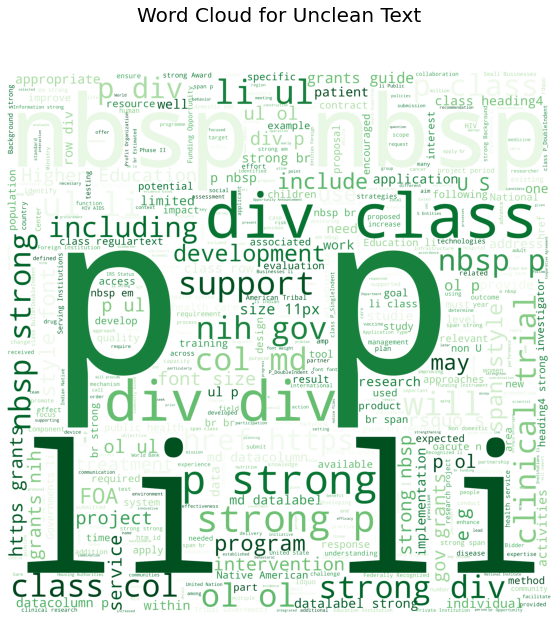

In [35]:
#word cloud for unclean text
draw_wordcloud(train.Text,'Word Cloud for Unclean Text')

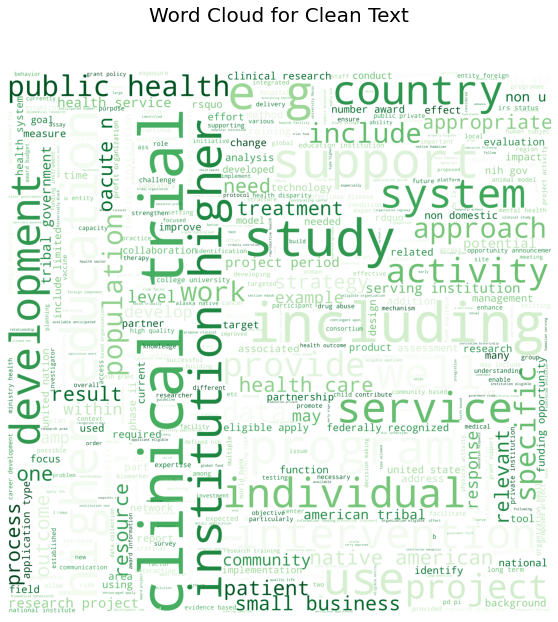

In [36]:
#word cloud for clean text
draw_wordcloud(train.clean_text,'Word Cloud for Clean Text')

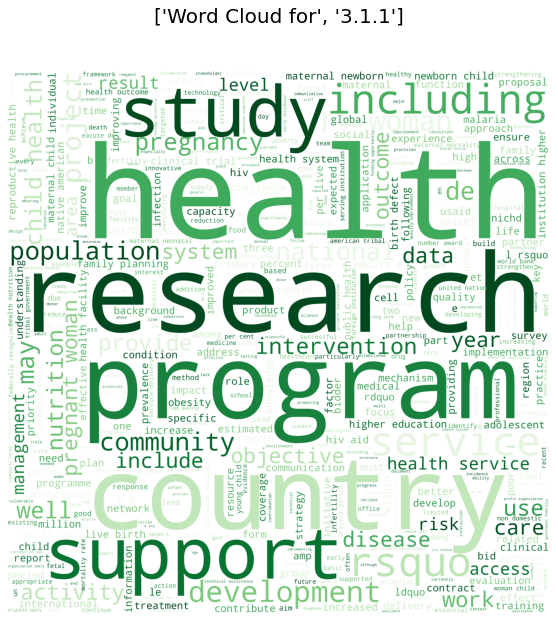

None


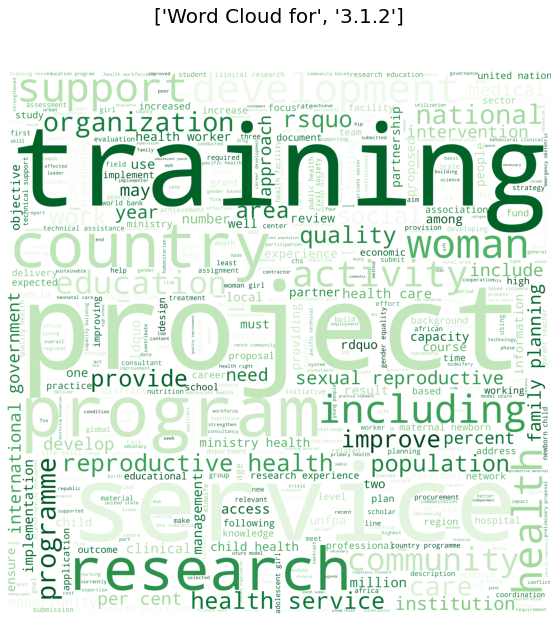

None


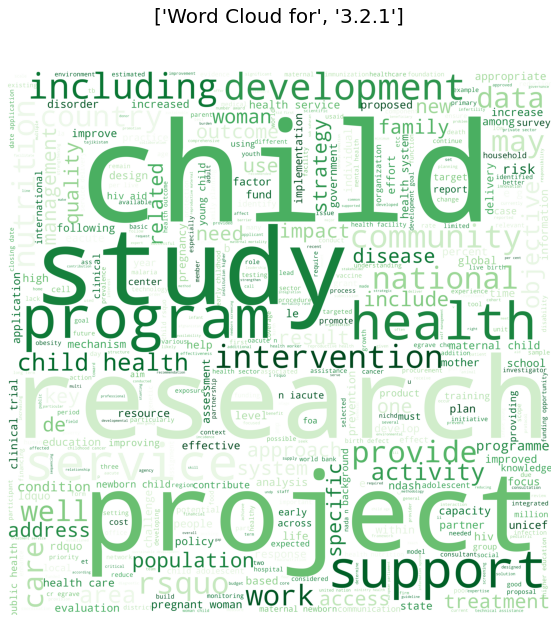

None


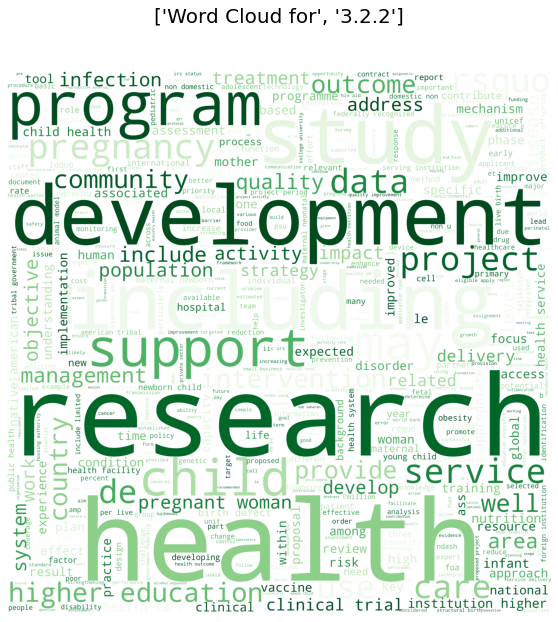

None


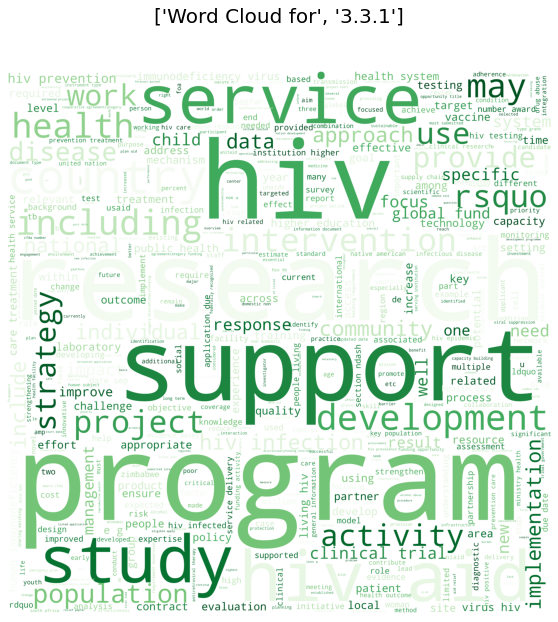

None


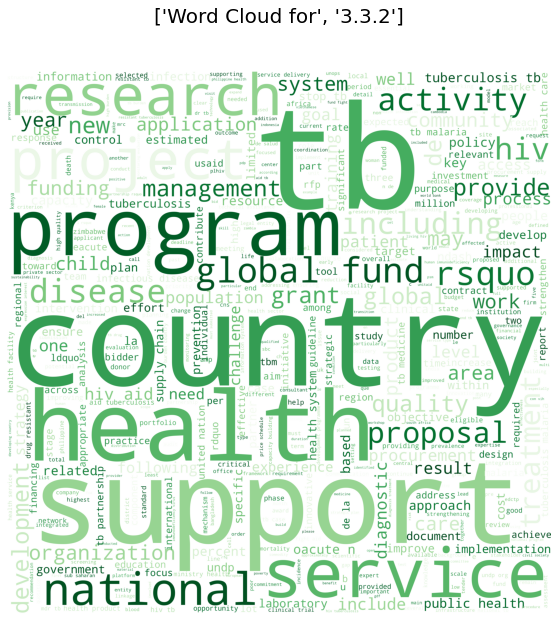

None


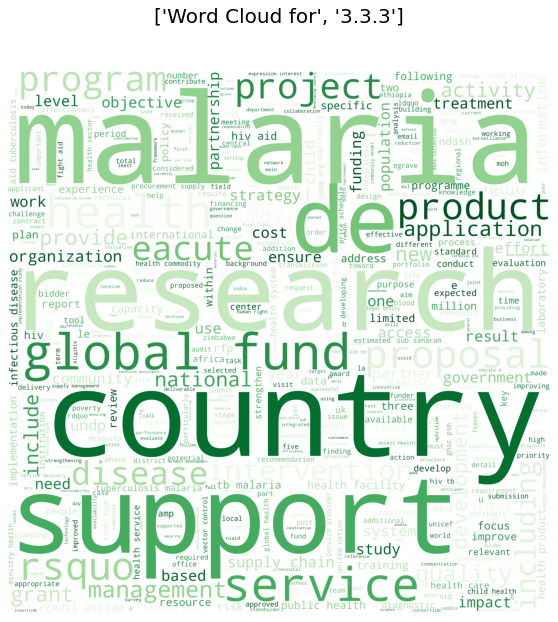

None


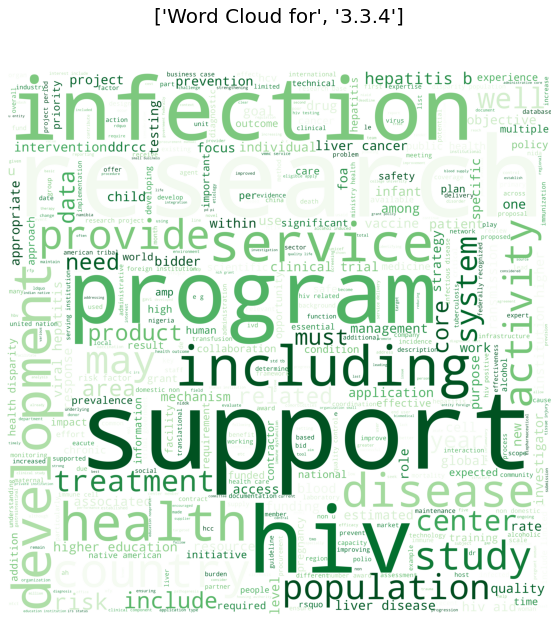

None


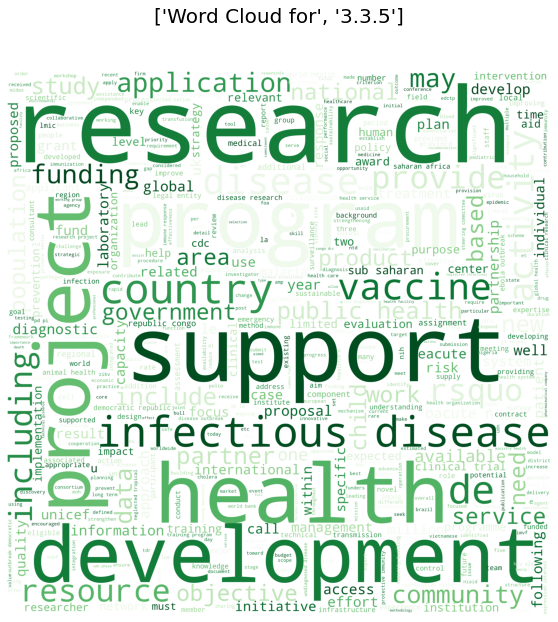

None


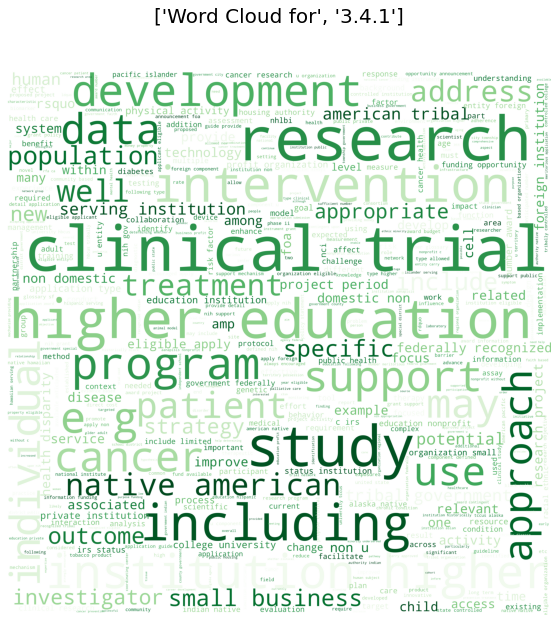

None


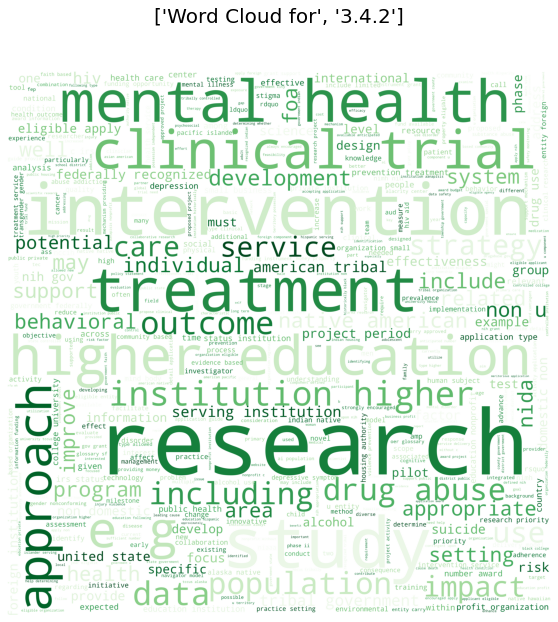

None


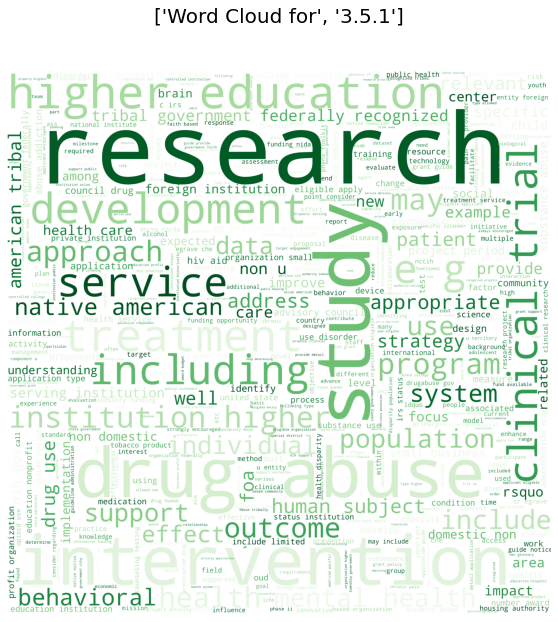

None


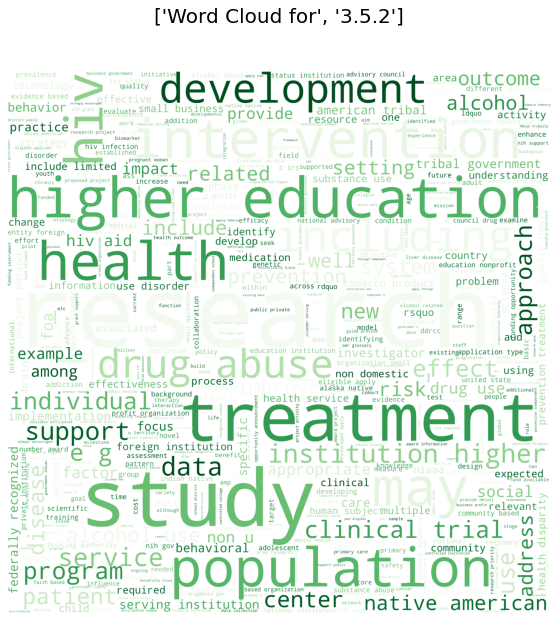

None


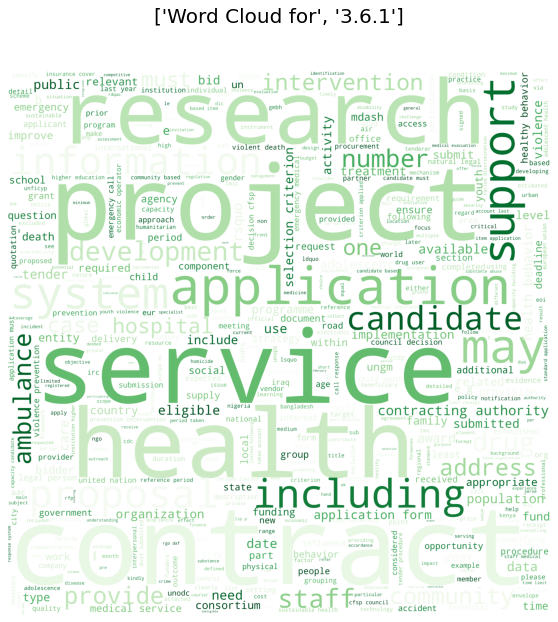

None


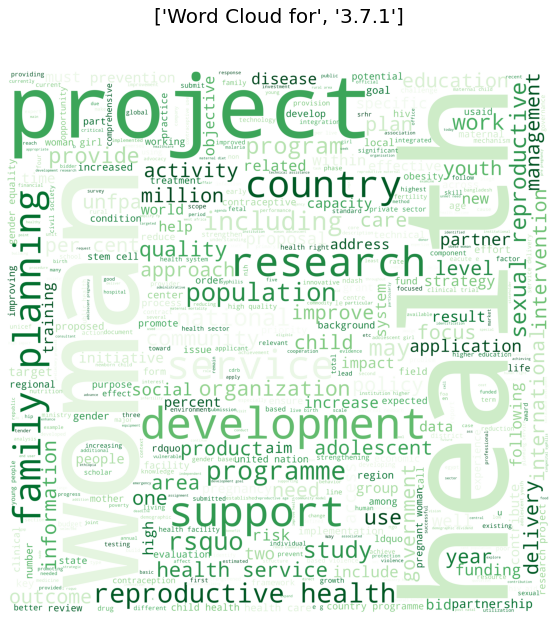

None


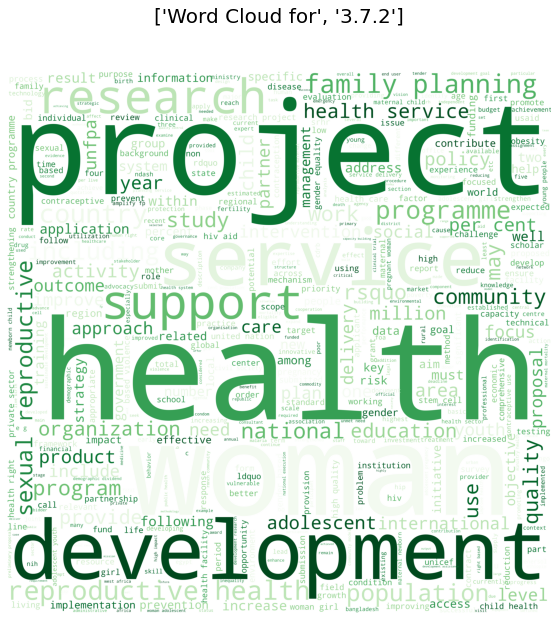

None


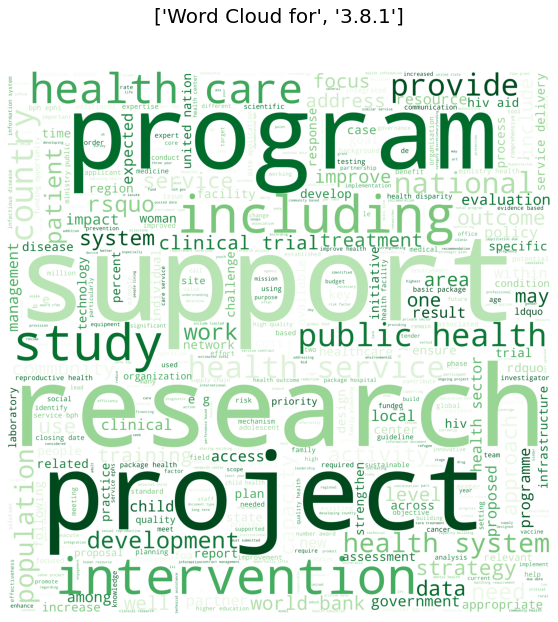

None


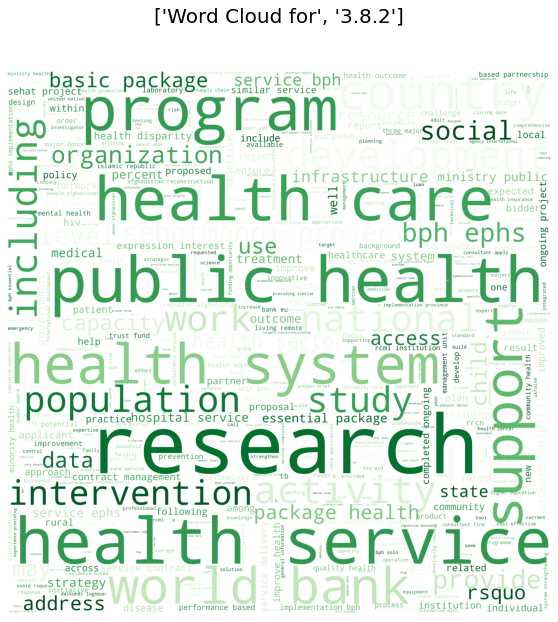

None


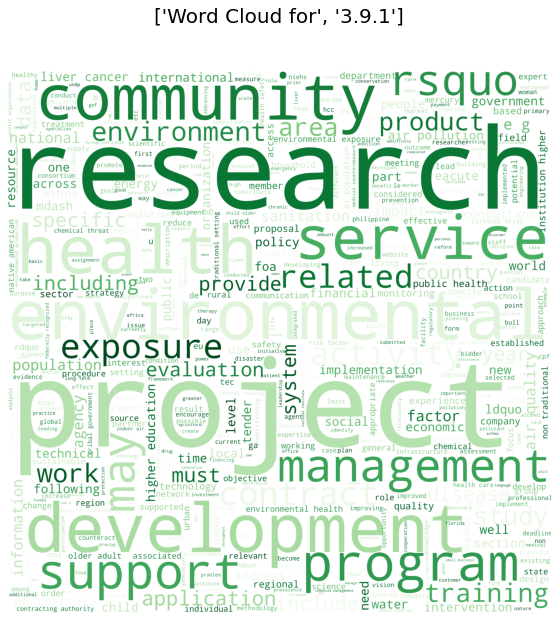

None


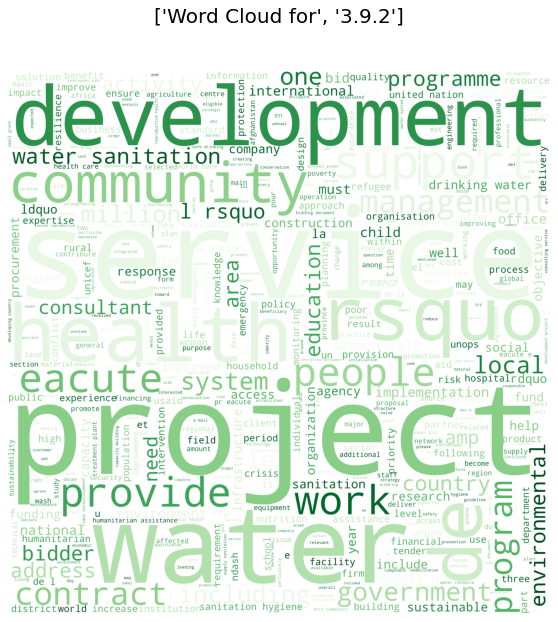

None


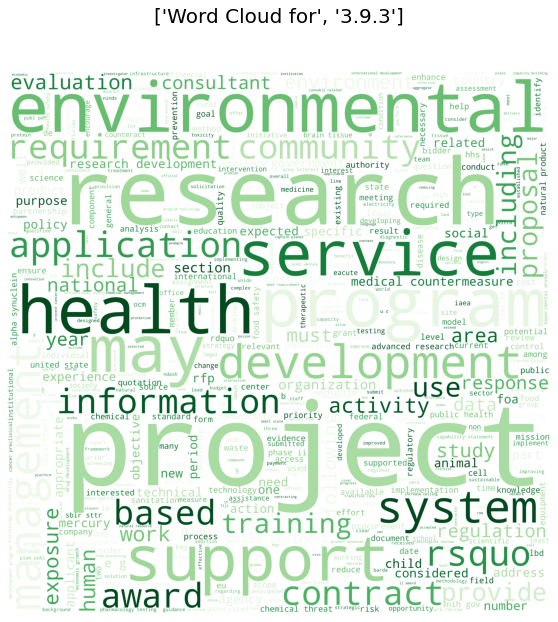

None


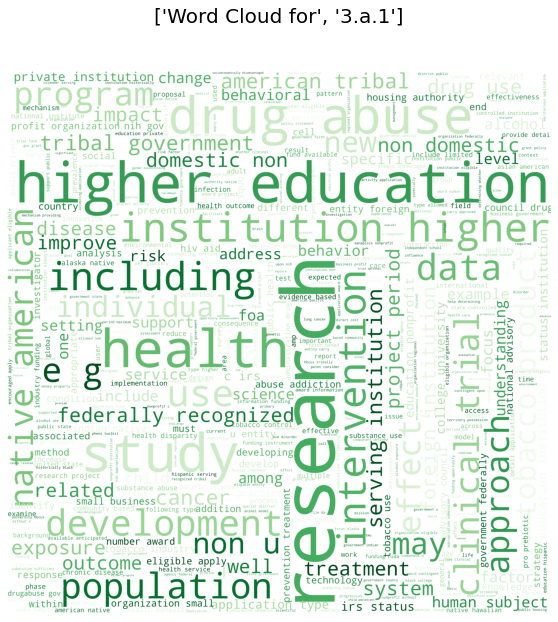

None


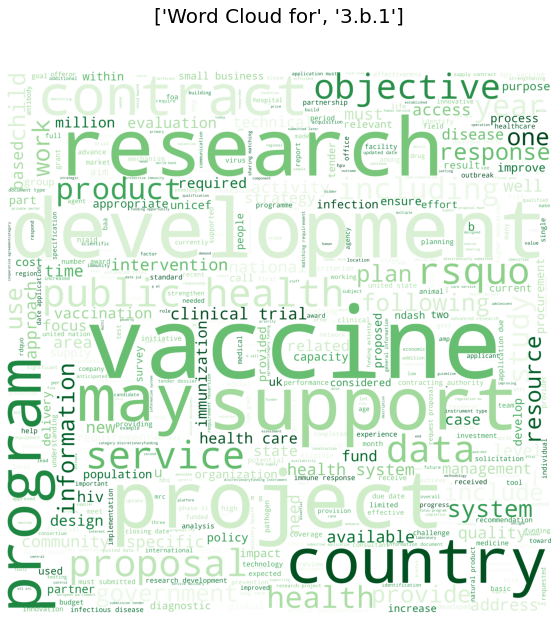

None


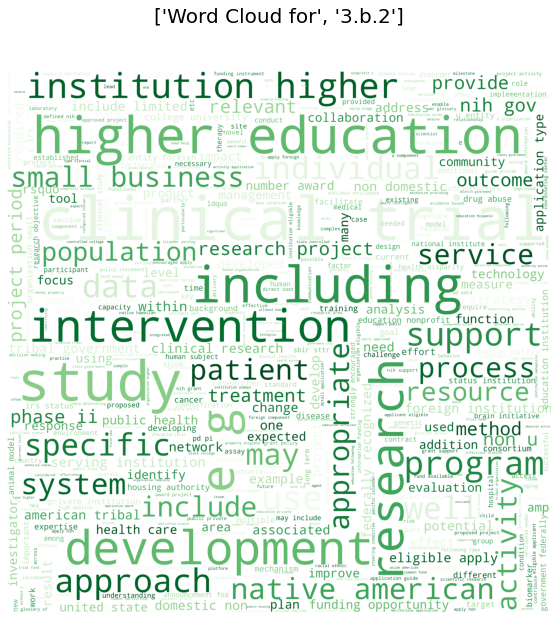

None


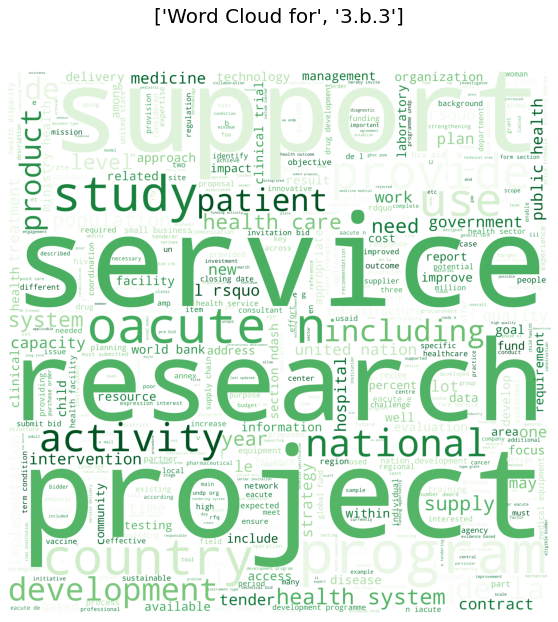

None


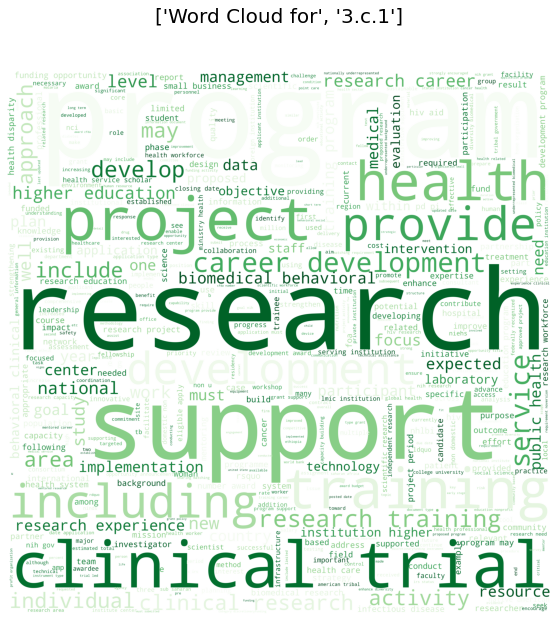

None


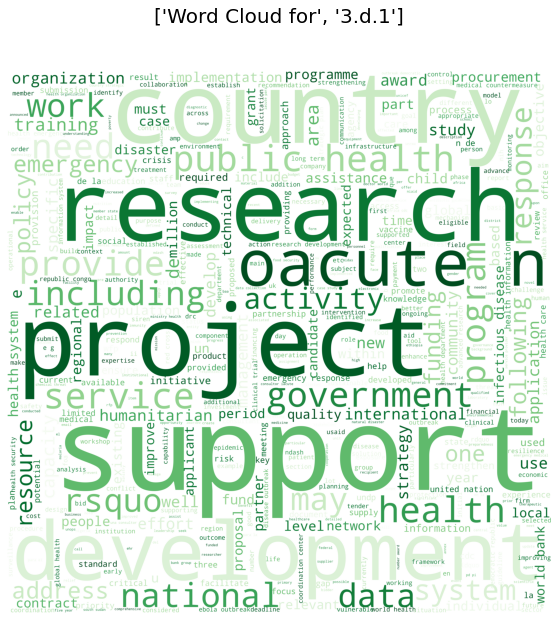

None


In [37]:
#word cloud for individual SDG3 27 indicators
for i in clean_train.columns[3:]:
    graph = clean_train[clean_train[i] == 1]
    print(draw_wordcloud(graph.clean_text,['Word Cloud for',i]))

### Word Counts

In the word count we can see the most repeated words in the text documents and how it spread between each 27 indicators.

In [38]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

cvec = CountVectorizer(stop_words='english')

tvec = TfidfVectorizer(stop_words='english')

In [39]:
#cvec count
cvec_text = cvec.fit_transform(train.clean_text)
cvec_df = pd.DataFrame(cvec_text.todense(),columns=cvec.get_feature_names())
cvec_text_count = cvec_df.sum(axis=0)
cvec_text_count.sort_values(ascending=False).head(10)

research       10492
health          9163
project         5375
clinical        5205
development     4882
study           4657
application     4565
support         4528
program         4257
service         4024
dtype: int64

In [40]:
#exploring word count in all 27 indicators
for i in clean_train.columns[3:]:
    text = clean_train[clean_train[i] == 1]
    cvec_text = cvec.fit_transform(text.clean_text)
    cvec_df = pd.DataFrame(cvec_text.todense(),columns=cvec.get_feature_names())
    cvec_text_count = cvec_df.sum(axis=0)
    print("-----------",i,"Word Count----------\n",cvec_text_count.sort_values(ascending=False).head(10))

----------- 3.1.1 Word Count----------
 health         979
child          468
woman          397
maternal       385
eacute         340
service        311
rsquo          309
development    275
project        248
research       245
dtype: int64
----------- 3.1.2 Word Count----------
 health         430
service        168
training       150
development    137
research       136
project        131
education      118
woman          110
care           107
community      105
dtype: int64
----------- 3.2.1 Word Count----------
 health         1066
child           998
service         442
development     339
maternal        332
project         320
research        314
rsquo           307
program         303
care            280
dtype: int64
----------- 3.2.2 Word Count----------
 health         782
child          481
eacute         330
maternal       311
project        303
research       300
care           299
development    288
rsquo          283
woman          271
dtype: int64
----------- 3.3.1 

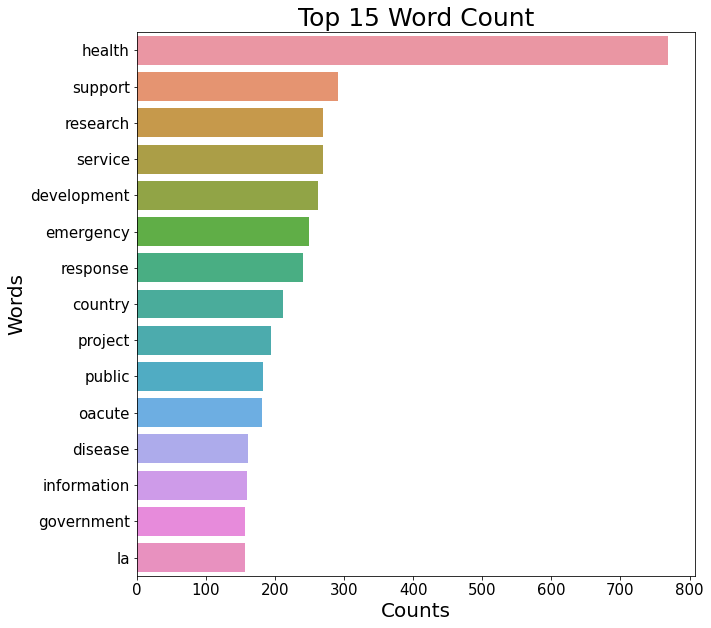

In [41]:
#making new dataframe for wordcount
cvec_data = pd.DataFrame(cvec_text_count)
cvec_data.reset_index(inplace=True)
cvec_data.columns = 'Words','Counts'

#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 Word Count',fontsize=25)

sns.barplot(data=cvec_data.sort_values(by='Counts',ascending=False).head(15),x='Counts',y='Words',orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Word Weights

In [42]:
#tvec count
tvec_text = tvec.fit_transform(train.clean_text)
tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
tvec_text_count = tvec_df.sum(axis=0)
tvec_text_count.sort_values(ascending=False).head(10)

health         136.251019
research       121.136793
diabetes        86.912231
service         73.245329
care            69.676799
project         68.589318
date            67.645345
hiv             66.883108
development     62.966590
support         58.768518
dtype: float64

In [43]:
#exploring word weight in all 27 indicators
for i in clean_train.columns[3:]:
    text = clean_train[clean_train[i] == 1]
    tvec_text = tvec.fit_transform(text.clean_text)
    tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
    tvec_text_count = tvec_df.sum(axis=0)
    print("-----------",i,"Word Weight Count----------\n",tvec_text_count.sort_values(ascending=False).head(10))

----------- 3.1.1 Word Weight Count----------
 health      18.647037
maternal    12.491993
child       10.730457
service      8.586815
woman        7.666081
newborn      7.462166
project      5.293532
support      5.168648
program      5.138910
research     5.103793
dtype: float64
----------- 3.1.2 Word Weight Count----------
 health         8.303602
service        4.035591
child          4.030717
maternal       3.931086
project        3.872513
programme      3.407091
newborn        3.336920
care           3.335343
woman          3.311547
development    3.149089
dtype: float64
----------- 3.2.1 Word Weight Count----------
 health       17.877918
child        17.520303
maternal     10.537470
newborn       8.331339
service       8.133588
date          6.955545
project       6.348824
program       6.248207
nutrition     6.185066
woman         6.083953
dtype: float64
----------- 3.2.2 Word Weight Count----------
 health      9.982710
child       8.209999
maternal    5.555135
infant      4.

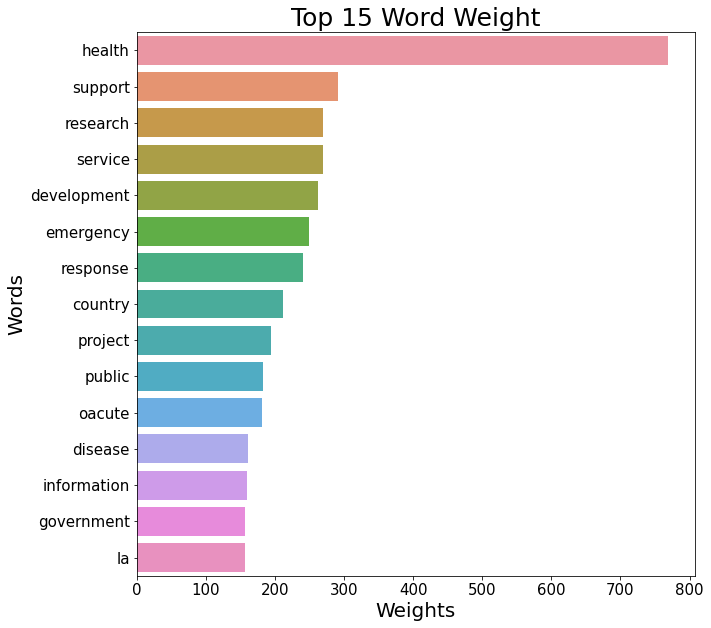

In [44]:
#make dataframe for graphing
tvec_data = pd.DataFrame(cvec_text_count)
tvec_data.reset_index(inplace=True)
tvec_data.columns = 'Words','Weights'

#graphing bar chart for word weight
plt.figure(figsize=(10,10))
plt.title('Top 15 Word Weight',fontsize=25)

sns.barplot(data=tvec_data.sort_values(by='Weights',ascending=False).head(15),x='Weights',y='Words',orient='h')

plt.xlabel('Weights', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Word Frequencies

The word count allow us to defined how many times a word is repeated however, it is hard to understand from just count. So I will be exploring how many time the word is repeted in proportion to the total word count shown as frequency in %:

In [45]:
cvec_data['Freq'] = cvec_data['Counts'] / len(cvec_data) * 100
cvec_data.sort_values(by='Counts',ascending=False, inplace=True)
cvec_data

,Words,Counts,Freq
2609,health,769,12.481740
5512,support,292,4.739490
4838,research,270,4.382405
5132,service,270,4.382405
1536,development,263,4.268788
...,...,...,...
3483,meaningful,1,0.016231
3484,meant,1,0.016231
3487,measureable,1,0.016231
3490,measuring,1,0.016231


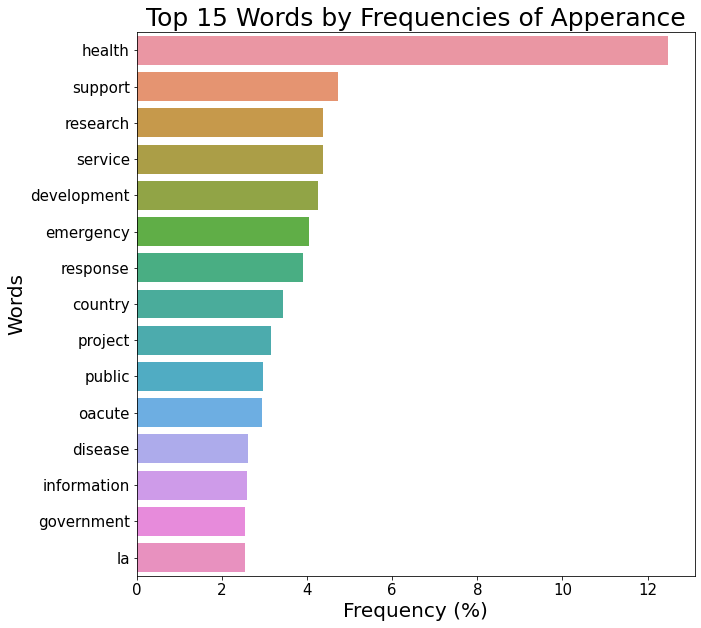

In [46]:
plt.figure(figsize=(10,10))
plt.title('Top 15 Words by Frequencies of Apperance',fontsize=25)

sns.barplot(data=cvec_data.head(15),x='Freq',y='Words',orient='h')

plt.xlabel('Frequency (%)',fontsize=20)
plt.ylabel('Words',fontsize=20)
plt.tick_params(labelsize=15)

### Indicators Count

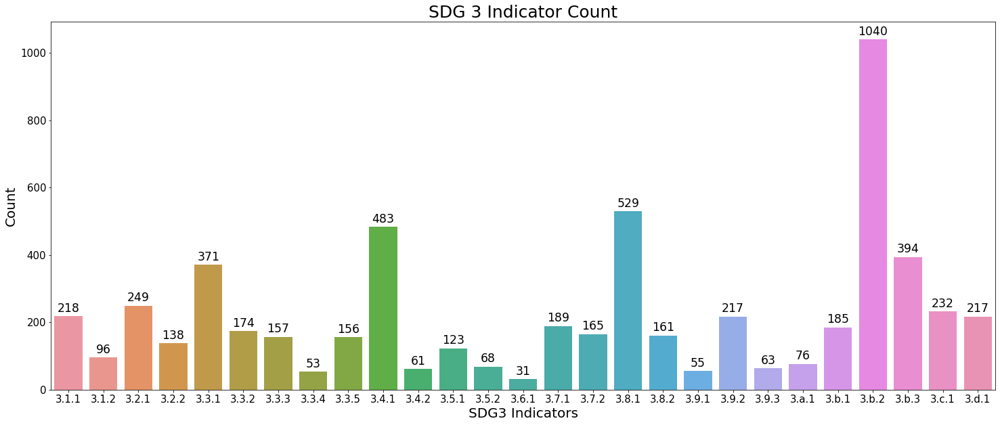

In [47]:
#total number of indicators
indi = pd.DataFrame(clean_train.iloc[:,3:].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = clean_train.iloc[:,3:].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom',fontsize='xx-large')

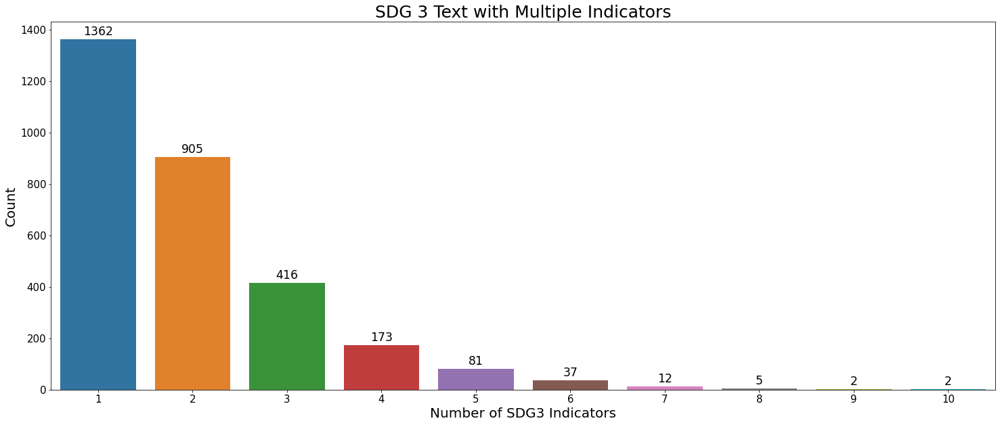

In [48]:
#number of text with multiple indicators
rowtotal = clean_train.iloc[:,3:].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Text with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize='xx-large')

---
# Test Data

This dataset includes the columns ID, Type, and Text.

In [49]:
test = pd.read_csv('data/Devex_test_questions.csv')

In [50]:
test

,Unique ID,Type,Text
0,49848,Organization,4th Sector Health: <p>4th Sector Health is a U...
1,52348,Organization,Action for Global Health: <p>Action for Global...
2,103541,Organization,Scottish Association for Mental Health (SAMH):...
3,52382,Organization,Singapore Immunology Network: <p>The Singapore...
4,47212,Organization,Coastal Conservation and Education Foundation ...
...,...,...,...
993,38108,Program,\r Ulaanbaatar Air Quality Improvement Program...
994,30360,Program,Supporting National Urban Health Mission<p>Thr...
995,33883,Program,WHO Contingency Fund - 2015<p>The project aims...
996,36296,Program,Lebanon Health Resilience Project<p>The projec...


### Clean Test Data

In [51]:
#clean test data set
clean_test_text=[]

for text in test.Text:
    clean_test_text.append(text_to_words(text))

In [52]:
clean_test_text

['th sector health th sector health usaid initiative form alliance exchange advance development health latin america caribbean mobilize business community health expert bring sustainable solution public health issue affect equitable development maternal child health reproductive health disease hiv aid solving problem together th sector health seek cultivate locally driven solution health challenge latin america caribbean use two approach mobilize various sector region use share resource towards health maximizing impact alliance develop public private alliance private company ngo government foundation develop fund implement health activity invest usaid fund leverage partner contribution foster greater private sector involvement health latin america caribbean alliance also help build capacity partner work across sector improve health region exchange support exchange across country latin america caribbean enable south south cross fertilization health expertise best practice lesson learned

In [53]:
test['clean_text'] = clean_test_text
test

,Unique ID,Type,Text,clean_text
0,49848,Organization,4th Sector Health: <p>4th Sector Health is a U...,th sector health th sector health usaid initia...
1,52348,Organization,Action for Global Health: <p>Action for Global...,action global health action global health afgh...
2,103541,Organization,Scottish Association for Mental Health (SAMH):...,scottish association mental health samh around...
3,52382,Organization,Singapore Immunology Network: <p>The Singapore...,singapore immunology network singapore immunol...
4,47212,Organization,Coastal Conservation and Education Foundation ...,coastal conservation education foundation ccef...
...,...,...,...,...
993,38108,Program,\r Ulaanbaatar Air Quality Improvement Program...,ulaanbaatar air quality improvement program go...
994,30360,Program,Supporting National Urban Health Mission<p>Thr...,supporting national urban health missionthroug...
995,33883,Program,WHO Contingency Fund - 2015<p>The project aims...,contingency fund project aim support contingen...
996,36296,Program,Lebanon Health Resilience Project<p>The projec...,lebanon health resilience projectthe project d...


In [54]:
clean_test = test[['Unique ID', 'Type', 'clean_text']]
clean_test

,Unique ID,Type,clean_text
0,49848,Organization,th sector health th sector health usaid initia...
1,52348,Organization,action global health action global health afgh...
2,103541,Organization,scottish association mental health samh around...
3,52382,Organization,singapore immunology network singapore immunol...
4,47212,Organization,coastal conservation education foundation ccef...
...,...,...,...
993,38108,Program,ulaanbaatar air quality improvement program go...
994,30360,Program,supporting national urban health missionthroug...
995,33883,Program,contingency fund project aim support contingen...
996,36296,Program,lebanon health resilience projectthe project d...


In [55]:
clean_test.to_csv('data/clean_test.csv',index=False)

### Test Data Visualization

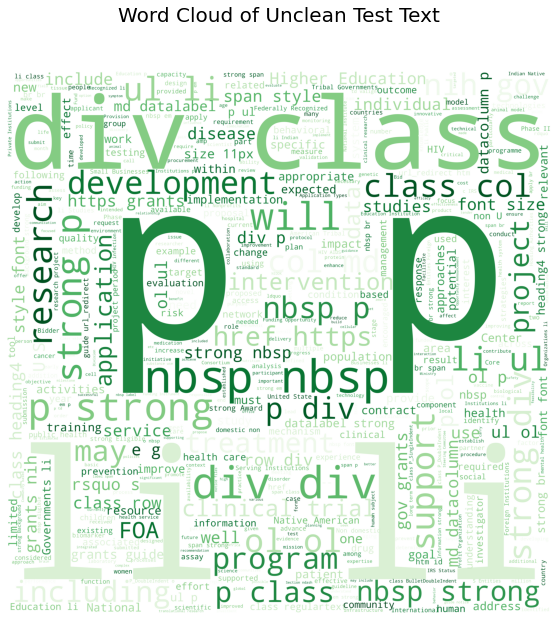

In [56]:
#word cloud of unclean text
draw_wordcloud(test.Text, "Word Cloud of Unclean Test Text")

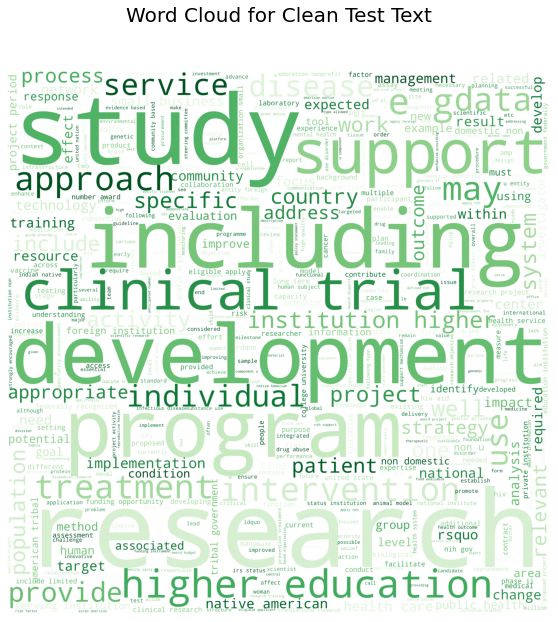

In [57]:
#word cloud of clean test text
draw_wordcloud(test.clean_text, "Word Cloud for Clean Test Text")

In [58]:
#cvec test count
cvec_test = cvec.fit_transform(test.clean_text)
cvec_test_df = pd.DataFrame(cvec_test.todense(),columns=cvec.get_feature_names())
cvec_test_count = cvec_test_df.sum(axis=0)
cvec_test_count.sort_values(ascending=False).head(10)

research       3775
health         3023
project        1867
study          1818
development    1744
clinical       1703
application    1646
support        1572
program        1459
institution    1351
dtype: int64

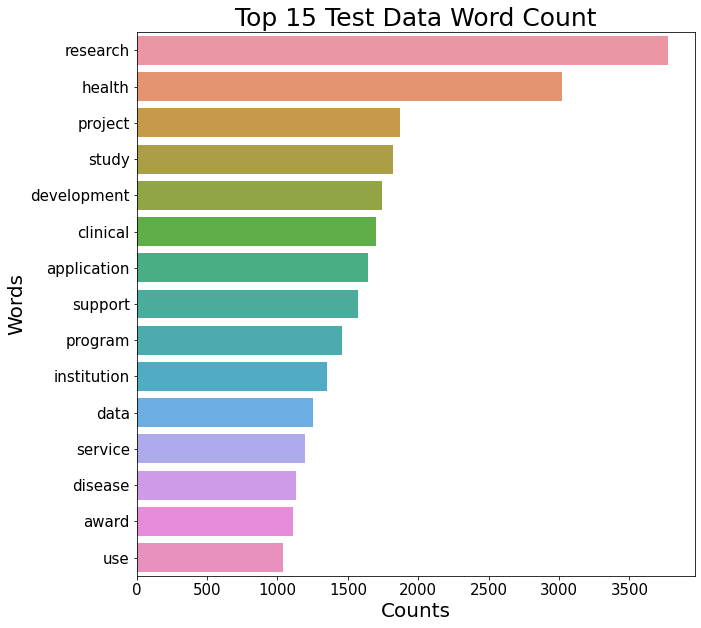

In [59]:
#making new dataframe for wordcount
cvec_test_data = pd.DataFrame(cvec_test_count)
cvec_test_data.reset_index(inplace=True)
cvec_test_data.columns = 'Words','Counts'

#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 Test Data Word Count',fontsize=25)

sns.barplot(data=cvec_test_data.sort_values(by='Counts',ascending=False).head(15),x='Counts',y='Words',orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

In [60]:
cvec_test_data['Freq'] = cvec_test_data['Counts'] / len(cvec_data) * 100
cvec_test_data.sort_values(by='Counts',ascending=False, inplace=True)
cvec_test_data

,Words,Counts,Freq
11703,research,3775,61.272521
6019,health,3023,49.066710
10838,project,1867,30.303522
13060,study,1818,29.508197
3596,development,1744,28.307093
...,...,...,...
7281,jnci,1,0.016231
7278,jinzj,1,0.016231
7277,jin,1,0.016231
7276,jihae,1,0.016231


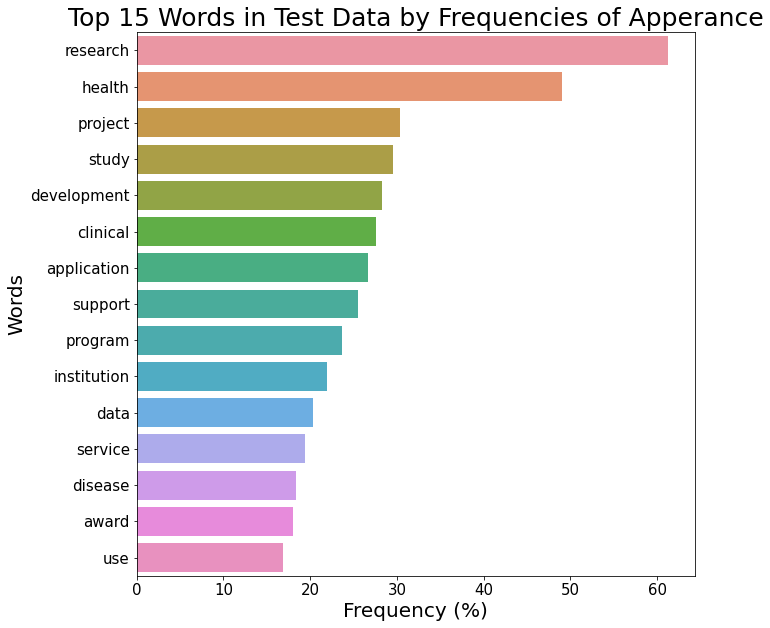

In [61]:
plt.figure(figsize=(10,10))
plt.title('Top 15 Words in Test Data by Frequencies of Apperance',fontsize=25)

sns.barplot(data=cvec_test_data.head(15),x='Freq',y='Words',orient='h')

plt.xlabel('Frequency (%)',fontsize=20)
plt.ylabel('Words',fontsize=20)
plt.tick_params(labelsize=15)